## 1. Import Required Modules

In [115]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import timeit
import warnings

import matplotlib.pyplot as plt
plt.style.use('seaborn-v0_8-whitegrid')

In [116]:
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV, LearningCurveDisplay
from sklearn.preprocessing import StandardScaler, MinMaxScaler , OneHotEncoder, RobustScaler, PowerTransformer
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, f1_score, precision_score, recall_score, ConfusionMatrixDisplay, roc_curve, auc
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import f_classif, SelectKBest
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_selection import SelectKBest
# from sklearn.feature_variance import VarianceThreshold

from sklearn.model_selection import ValidationCurveDisplay

from scipy.stats import skew


In [76]:
from yellowbrick.model_selection import FeatureImportances, LearningCurve, ValidationCurve
from yellowbrick.classifier import ConfusionMatrix, ROCAUC


In [82]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss

In [78]:
from ucimlrepo import fetch_ucirepo 

In [112]:
warnings.filterwarnings("ignore")

## 2. Define GTID for random seed

In [79]:
def gtid():
    return  903952938

## 3. Load Data
1. Diabetes
2. Customer Churn

In [80]:
# Get the current directory of the notebook
current_dir = os.path.dirname(os.path.abspath('__file__'))

In [83]:

def load_dataset_1(test_size=0.2, random_state=gtid(), id=891):
        print(id)
        cdc_diabetes_health_indicators = fetch_ucirepo(id=id) 
        # data (as pandas dataframes) 
        X = cdc_diabetes_health_indicators.data.features 
        y = cdc_diabetes_health_indicators.data.targets
        temp  = X.copy()
        temp['Diabetes'] = y
        temp.drop_duplicates(inplace = True)
        cols_to_drop = ['Smoker','NoDocbcCost','Sex', 'AnyHealthcare', 'Education', 'Income']
        temp = temp.drop(columns=cols_to_drop)
        # Split the data into training and testing sets
        X,y = temp[[i for i in temp.columns if i!='Diabetes']], temp[['Diabetes']]
        # X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_state)
        X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=test_size, random_state=random_state)
        return X_train, X_test, y_train, y_test
  
def load_dataset_2(test_size=0.2, random_state=gtid()):
        train_file_path = os.path.join(current_dir, 'churn', 'train.csv')
        test_file_path = os.path.join(current_dir, 'churn', 'test.csv')
        train_df = pd.read_csv(train_file_path).astype('category')
        test_df = pd.read_csv(test_file_path).astype('category')
        train_df['Gender'] = train_df['Gender'].apply(lambda x: 1 if x=='Female' else 0)
        test_df['Gender'] = test_df['Gender'].apply(lambda x: 1 if x=='Female' else 0)
        train_df.dropna(inplace=True)
        test_df.dropna(inplace=True)
        features  = [i for i in train_df.columns if i not in ['CustomerID', "Churn"]]
        targets = ['Churn']
        X_train, X_test, y_train, y_test = train_df[features], test_df[features], train_df[targets], test_df[targets]
        # X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.3, random_state=random_state)
        X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=test_size, random_state=random_state)
        return X_train, X_test, y_train, y_test


## 4. Understand & Hypothesize Data

### 4.1 Data 1: Diabetes Prediction (Binary Classifier)

In [113]:
X, _, y, _ = load_dataset_1()
X.describe()

891


,HighBP,HighChol,CholCheck,BMI,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,GenHlth,MentHlth,PhysHlth,DiffWalk,Age
count,183579.000000,183579.000000,183579.000000,183579.000000,183579.000000,183579.000000,183579.000000,183579.000000,183579.000000,183579.000000,183579.000000,183579.000000,183579.000000,183579.000000,183579.000000
mean,0.454219,0.441597,0.959358,28.689017,0.045278,0.103699,0.732393,0.612352,0.794426,0.060748,2.600695,3.503004,4.673579,0.185816,8.092178
std,0.497901,0.496579,0.197460,6.779624,0.207913,0.304871,0.442713,0.487215,0.404121,0.238868,1.064086,7.702557,9.038586,0.388960,3.094215
min,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,0.000000,0.000000,1.000000,24.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,6.000000
50%,0.000000,0.000000,1.000000,27.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,3.000000,0.000000,0.000000,0.000000,8.000000
75%,1.000000,1.000000,1.000000,32.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,3.000000,2.000000,4.000000,0.000000,10.000000
max,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,30.000000,30.000000,1.000000,13.000000


In [114]:
print("Feature Data has",len(X),"rows and", len(X.columns),"columns.")
print("Target Data has",len(y),"rows and", len(y.columns),"columns.")
if X.isnull().values.any():
    print("Warning: Missing Data")
if y.isnull().values.any():
    print("Warning: Missing Data")

Feature Data has 183579 rows and 15 columns.
Target Data has 183579 rows and 1 columns.


In [80]:
cols_to_drop = ['Smoker' ,'Veggies','Fruits' ,'NoDocbcCost','Sex', 'AnyHealthcare', 'Education', 'Income']

In [82]:
X=X.drop(columns=cols_to_drop)

Identify different types of features

In [48]:
# Function to identify non-binary categorical features
def identify_non_binary_categorical_features(df):
    binary_features = []
    non_binary_categorical_features = []
    numerical_features = df.select_dtypes(include=['number']).columns.tolist()
    print(len(numerical_features))
    
    for col in df.columns:
        if df[col].dtype == 'object' or len(df[col].unique()) < 10:  # Assuming categorical if less than 10 unique values
            unique_values = df[col].nunique()
            if unique_values == 2:
                binary_features.append(col)
            elif unique_values > 2:
                non_binary_categorical_features.append(col)
    
    # Remove binary features from numerical features list
    numerical_features = [col for col in numerical_features if col not in binary_features and col not in non_binary_categorical_features ]
    
    return binary_features, non_binary_categorical_features, numerical_features

binary_features, non_binary_categorical_features, numerical_features = identify_non_binary_categorical_features(X)

print("Binary Features:", binary_features)
print("Non-Binary Categorical Features:", non_binary_categorical_features)
print("Numerical Features:", numerical_features)

13
Binary Features: ['HighBP', 'HighChol', 'CholCheck', 'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'HvyAlcoholConsump', 'DiffWalk']
Non-Binary Categorical Features: ['GenHlth']
Numerical Features: ['BMI', 'MentHlth', 'PhysHlth', 'Age']


#### Hypothesis 1: Feature Importance in Data 1
- Hypothesis: The features 'HighBP', 'HighChol', 'BMI', 'Age', 'HeartDiseaseorAttack' and 'Stroke' flag  will be the most predictive for detecting the target condition (e.g., diabetes or another health-related condition).
- Justification: High blood pressure (HighBP) and high cholesterol (HighChol) are known risk factors for many health conditions. BMI and Age are also commonly associated with various health risks.

To test the hypothesis that 'HighBP', 'HighChol', 'BMI', and 'Age' are the most predictive features, we can use statistical methods such as Anova F-test

In [49]:
# Apply one-hot encoding to non-binary categorical features
encoder = OneHotEncoder(sparse_output=False)
encoded_features = encoder.fit_transform(X[non_binary_categorical_features])
encoded_df = pd.DataFrame(encoded_features, index=X.index, columns=encoder.get_feature_names_out(non_binary_categorical_features))

# Combine encoded features with the original dataset
X_encoded = pd.concat([X.drop(non_binary_categorical_features, axis=1), encoded_df], axis=1)

In [50]:
scaler=RobustScaler()
X_preprocessed = scaler.fit_transform(X_encoded)

In [51]:
X.drop(non_binary_categorical_features, axis=1).shape, encoded_df.shape, X_encoded.shape

((183579, 12), (183579, 5), (183579, 17))

In [54]:

# Perform the ANOVA F-test
X_preprocessed_df = pd.DataFrame(X_preprocessed, columns=X_encoded.columns)
F, p = f_classif(X_preprocessed_df, y)

# Create a DataFrame for easy interpretation
feature_scores = pd.DataFrame({'Feature': X_preprocessed_df.columns, 'F-Score': F, 'p-Value': p})
print(feature_scores.sort_values(by='F-Score', ascending=False))


                 Feature       F-Score        p-Value
0                 HighBP  12417.516032   0.000000e+00
3                    BMI   8017.647810   0.000000e+00
10              DiffWalk   7954.248860   0.000000e+00
1               HighChol   7112.758814   0.000000e+00
11                   Age   5821.465649   0.000000e+00
15             GenHlth_4   5710.060822   0.000000e+00
5   HeartDiseaseorAttack   5377.374608   0.000000e+00
9               PhysHlth   4424.846583   0.000000e+00
16             GenHlth_5   4037.628452   0.000000e+00
12             GenHlth_1   3761.493693   0.000000e+00
13             GenHlth_2   3685.690957   0.000000e+00
6           PhysActivity   1914.514186   0.000000e+00
4                 Stroke   1820.784052   0.000000e+00
2              CholCheck    953.506709  7.896945e-209
7      HvyAlcoholConsump    784.576641  2.814312e-172
8               MentHlth    558.906961  2.225501e-123
14             GenHlth_3    516.647237  3.267130e-114


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:1310: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [55]:
X_preprocessed_df['Diabetes'] = y
features=['HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker', 'Stroke',
       'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'MentHlth',
       'PhysHlth', 'DiffWalk', 'Sex', 'Age']

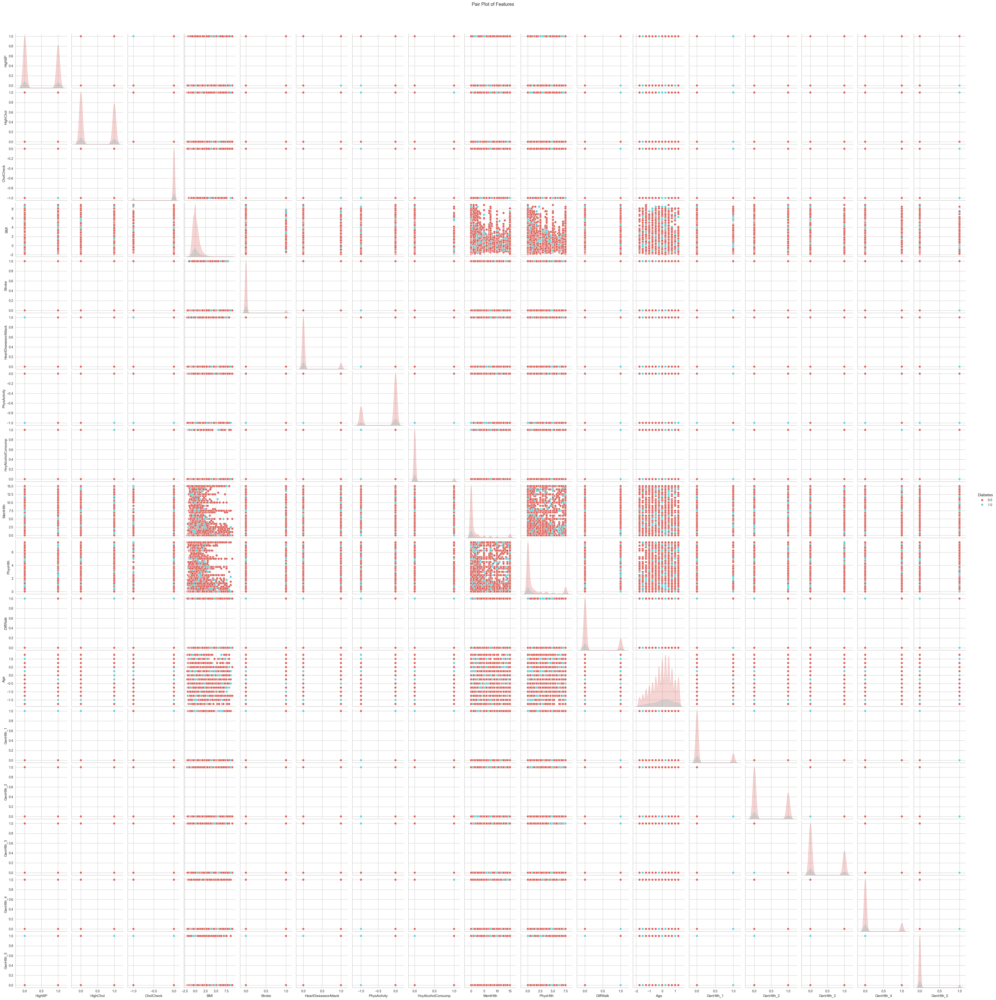

In [58]:
sns.pairplot(data=X_preprocessed_df, hue="Diabetes", palette="hls")  # Color points by class label

# Add a title (optional)
plt.suptitle("Pair Plot of Features", y=1.02)  # Adjust y-position for title placement
plt.show()

#### Hypothesis 2: Class Imbalance
**Class balancing using SMOTE (Synthetic Minority Over-sampling Technique) WILL improve model performance. F1-score**

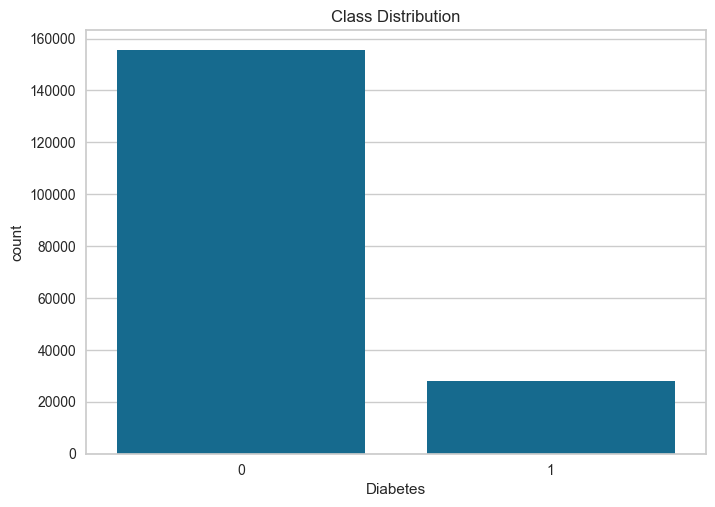

In [59]:
sns.countplot(x=y.Diabetes)
plt.title('Class Distribution')
plt.show()

In [60]:

def class_scalar_balancer(scaler, splits=5):

    X_scaled = scaler.fit_transform(X_encoded)
    # Prepare stratified k-fold cross-validation splits with SMOTE
    skf = StratifiedKFold(n_splits=splits, shuffle=True, random_state=gtid())

    for train_index, test_index in skf.split(X_scaled, y):
        X_train, X_test = X_scaled[train_index], X_scaled[test_index]
        y_train, y_test = np.array(y)[train_index], np.array(y)[test_index]
        
        # Apply SMOTE to the training data
        smote = SMOTE(random_state=gtid())
        X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)
        
        # Flatten the target arrays if necessary
        y_train_resampled = y_train_resampled.ravel()
        y_test = y_test.ravel()
        
        # Store the processed train-test splits
        folds.append((X_train_resampled, X_test, y_train_resampled, y_test))
    return folds


In [61]:
folds=[]
folds = class_scalar_balancer(scaler)

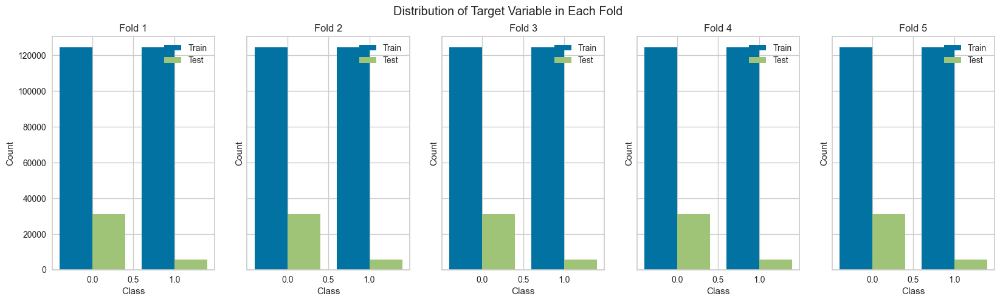

In [62]:
# Visualize the distribution of the target variable in each fold
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 5), sharey=True)
fig.suptitle('Distribution of Target Variable in Each Fold')

for i, (X_train_resampled, X_test, y_train_resampled, y_test) in enumerate(folds):
    ax = axes[i]
    train_counts = pd.Series(y_train_resampled).value_counts()
    test_counts = pd.Series(y_test).value_counts()
    
    ax.bar(train_counts.index - 0.2, train_counts.values, width=0.4, label='Train')
    ax.bar(test_counts.index + 0.2, test_counts.values, width=0.4, label='Test')
    
    ax.set_title(f'Fold {i+1}')
    ax.set_xlabel('Class')
    ax.set_ylabel('Count')
    ax.legend()

plt.show()

In [63]:

nm = NearMiss(version = 1 , n_neighbors = 10)

x_sm,y_sm= nm.fit_resample(X,y)

In [64]:
y_sm.value_counts()

Diabetes
0           28143
1           28143
Name: count, dtype: int64

In [65]:
y_sm.shape , x_sm.shape

((56286, 1), (56286, 13))

In [66]:
X_train , X_test , Y_train , Y_test = train_test_split(x_sm,y_sm, test_size=0.3 , random_state=42)

In [72]:
df = pd.DataFrame(X_train, columns=X.columns)
df['Diabetes']=Y_train

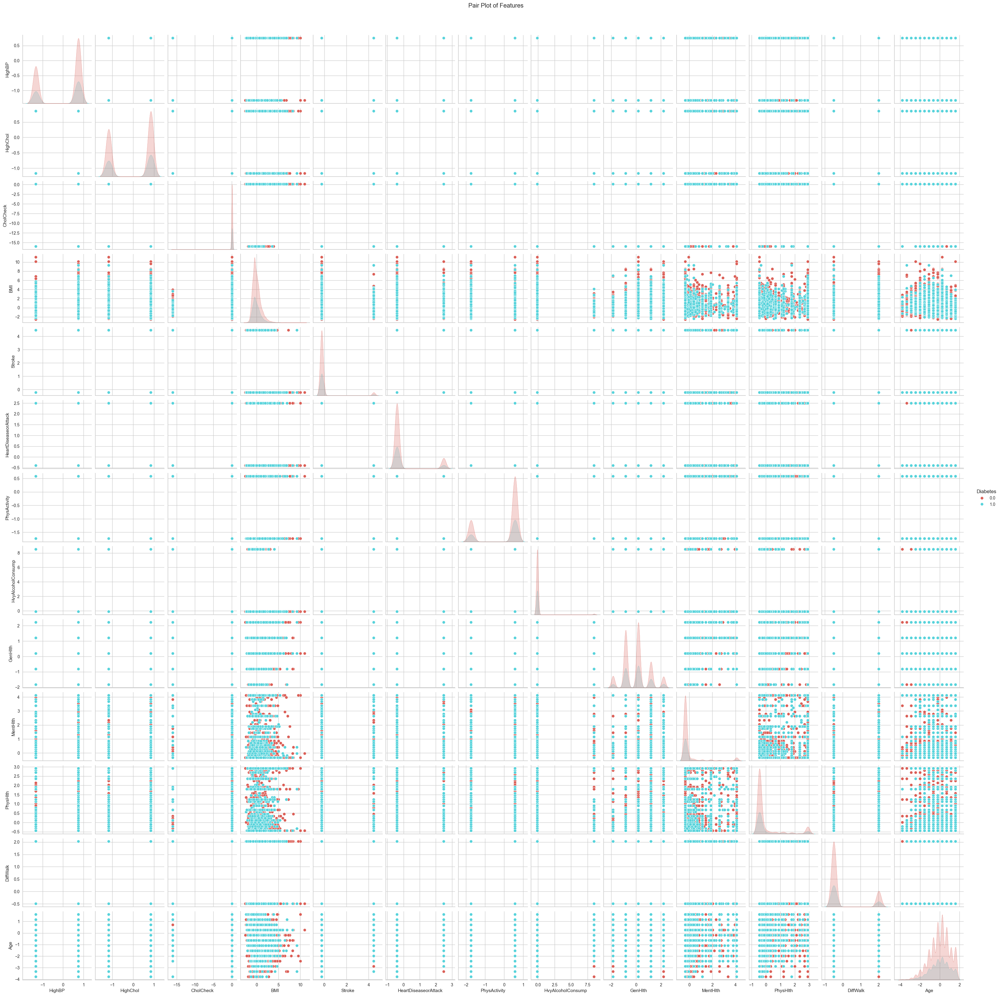

In [73]:
sns.pairplot(data=df, hue="Diabetes", palette="hls")  # Color points by class label

# Add a title (optional)
plt.suptitle("Pair Plot of Features", y=1.02)  # Adjust y-position for title placement
plt.show()

Check Outliers

In [ ]:
for i, (X_train_resampled, X_test, y_train_resampled, y_test) in enumerate(folds):
    print("fold number: ", i)
    X_train_resampled_df = pd.DataFrame(X_train_resampled, columns=X_encoded.columns)
    for column in X_train_resampled_df[numerical_features].columns:
        plt.figure(figsize=(10, 4))
        sns.boxplot(x=X[column])
        plt.title(f'Box Plot of {column}')
        plt.show()
    break

In [ ]:
#Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = X_encoded['BMI'].quantile(0.25)
Q3 = X_encoded['BMI'].quantile(0.75)

# Calculate IQR
IQR = Q3 - Q1

# Calculate lower and upper bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter outliers
outliers = X_encoded[(X_encoded['BMI'] < lower_bound) | (X_encoded['BMI'] > upper_bound)]
outliers['BMI'].min(), outliers['BMI'].max()

#### Hypothesis 3: Algorithm Performance
**A. Neural Networks (ANN) will outperform Support Vector Machines (SVM) and k-Nearest Neighbors (k-NN)**

1. Neural Networks: ANNs can capture complex non-linear relationships and interactions between features. They are highly flexible and can approximate any continuous function given enough data and computational resources.
2. Support Vector Machines: SVMs are effective in high-dimensional spaces and are known for their ability to handle binary classification tasks with clear margins of separation. However, they might struggle with large datasets and complex feature interactions.
3. k-Nearest Neighbors: k-NN is simple and intuitive but can be less effective with high-dimensional data and large datasets due to the curse of dimensionality and computational inefficiency.
Mathematically, the effectiveness of Neural Networks can be justified by the Universal Approximation Theorem, which states that a feedforward network with a single hidden layer containing a finite number of neurons can approximate any continuous function under certain conditions.

**B. Assumption about Train and Test Time**

_Training Time:_

1. Neural Networks (ANN): Generally expected to have a longer training time compared to SVM and k-NN due to the iterative nature of training and the complexity of backpropagation.
2. Support Vector Machines (SVM): Expected to have moderate training time, especially with non-linear kernels, as SVMs solve a quadratic optimization problem.
3. k-Nearest Neighbors (k-NN): Typically has a short training time because it essentially stores the training data without building a model.

_Testing Time:_

1. Neural Networks (ANN): Expected to have a short testing time as predictions are made using a feedforward pass through the network.
2. Support Vector Machines (SVM): Expected to have a moderate testing time, especially with non-linear kernels, because each prediction involves computing the distance to support vectors.
3. k-Nearest Neighbors (k-NN): Generally expected to have a longer testing time because it involves calculating the distance to all training samples for each test sample.

### 4.2 Data 2: Customer Churn

In [34]:
train_file_path = pd.read_csv(os.path.join(current_dir, 'churn', 'train.csv'))

In [37]:
X, y =train_file_path[[i for i in train_file_path.columns if i!='Churn']],  train_file_path[['Churn']]

In [35]:
train_file_path.head()

,CustomerID,Age,Gender,Tenure,Usage Frequency,Support Calls,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn
0,2.0,30.0,Female,39.0,14.0,5.0,18.0,Standard,Annual,932.0,17.0,1.0
1,3.0,65.0,Female,49.0,1.0,10.0,8.0,Basic,Monthly,557.0,6.0,1.0
2,4.0,55.0,Female,14.0,4.0,6.0,18.0,Basic,Quarterly,185.0,3.0,1.0
3,5.0,58.0,Male,38.0,21.0,7.0,7.0,Standard,Monthly,396.0,29.0,1.0
4,6.0,23.0,Male,32.0,20.0,5.0,8.0,Basic,Monthly,617.0,20.0,1.0


In [38]:
X.Gender.unique()

array(['Female', 'Male', nan], dtype=object)

In [39]:
X['Gender'] = X['Gender'].apply(lambda x: 1 if x=='Female' else 0)

C:\Users\User\AppData\Local\Temp\ipykernel_24820\2302292348.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['Gender'] = X['Gender'].apply(lambda x: 1 if x=='Female' else 0)


In [40]:
print("Feature Data has",len(X),"rows and", len(X.columns),"columns.")
print("Target Data has",len(y),"rows and", len(y.columns),"columns.")
if X.isnull().values.any():
    missing_data = X.isnull().sum()
    print("Warning: Missing Data")
    print("Count: ", X.isnull().any(axis=1).sum())
if y.isnull().values.any():
    print("Warning: Missing Data")
    print("Count: ", y.isnull().any(axis=1).sum())

Feature Data has 440833 rows and 11 columns.
Target Data has 440833 rows and 1 columns.
Count:  1
Count:  1


In [41]:
X.dropna(inplace=True)
y.dropna(inplace=True)

C:\Users\User\AppData\Local\Temp\ipykernel_24820\241906315.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.dropna(inplace=True)
C:\Users\User\AppData\Local\Temp\ipykernel_24820\241906315.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y.dropna(inplace=True)


In [42]:
X.columns

Index(['CustomerID', 'Age', 'Gender', 'Tenure', 'Usage Frequency',
       'Support Calls', 'Payment Delay', 'Subscription Type',
       'Contract Length', 'Total Spend', 'Last Interaction'],
      dtype='object')

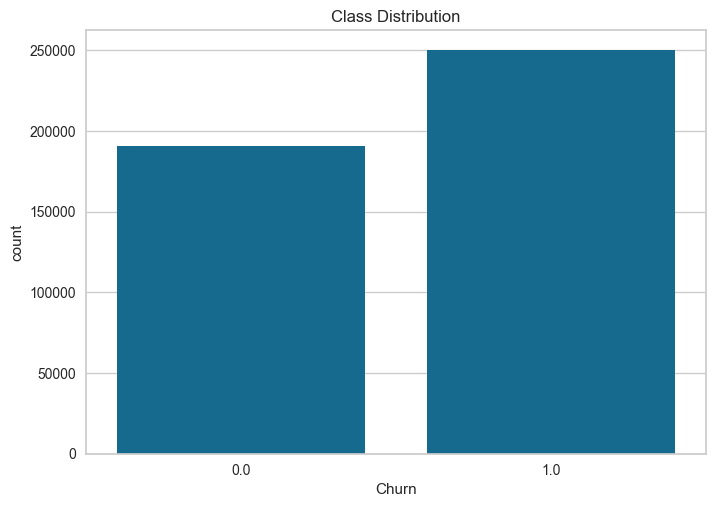

In [43]:
sns.countplot(x=y.Churn)
plt.title('Class Distribution')
plt.show()

#### Hypothesis 4: For 2nd Data 'Total Spend', 'Usage Frequency', and 'Payment Delay' will be the most predictive features for churn prediction.
Customers with lesser spend, lower usage frequency, and frequent payment delays are more likely to churn based on common industry insights.

In [45]:
# Function to identify non-binary categorical features
def identify_non_binary_categorical_features(df):
    binary_features = []
    non_binary_categorical_features = []
    numerical_features = df.select_dtypes(include=['number']).columns.tolist()
    print(len(numerical_features))
    
    for col in df.columns:
        if df[col].dtype == 'object' or len(df[col].unique()) < 10:  # Assuming categorical if less than 10 unique values
            unique_values = df[col].nunique()
            if unique_values == 2:
                binary_features.append(col)
            elif unique_values > 2:
                non_binary_categorical_features.append(col)
    
    # Remove binary features from numerical features list
    numerical_features = [col for col in df.columns if col not in binary_features and col not in non_binary_categorical_features ]
    
    return binary_features, non_binary_categorical_features, numerical_features

binary_features, non_binary_categorical_features, numerical_features = identify_non_binary_categorical_features(X)
print("Binary Features:", binary_features)
print("Non-Binary Categorical Features:", non_binary_categorical_features)
print("Numerical Features:", numerical_features)

9
Binary Features: ['Gender']
Non-Binary Categorical Features: ['Subscription Type', 'Contract Length']
Numerical Features: ['CustomerID', 'Age', 'Tenure', 'Usage Frequency', 'Support Calls', 'Payment Delay', 'Total Spend', 'Last Interaction']


In [46]:
# Apply one-hot encoding to non-binary categorical features
encoder = OneHotEncoder(sparse_output=False)
encoded_features = encoder.fit_transform(X[non_binary_categorical_features])
encoded_df = pd.DataFrame(encoded_features, index=X.index, columns=encoder.get_feature_names_out(non_binary_categorical_features))

# Combine encoded features with the original dataset
X_encoded = pd.concat([X.drop(non_binary_categorical_features, axis=1), encoded_df], axis=1)

scaler=RobustScaler()
X_preprocessed = scaler.fit_transform(X_encoded)

In [47]:
X_encoded.shape, X_preprocessed.shape

((440832, 15), (440832, 15))

In [48]:

# Perform the ANOVA F-test
X_preprocessed_df = pd.DataFrame(X_preprocessed, columns=X_encoded.columns)
F, p = f_classif(X_preprocessed_df, y)

# Create a DataFrame for easy interpretation
feature_scores = pd.DataFrame({'Feature': X_preprocessed_df.columns, 'F-Score': F, 'p-Value': p})
print(feature_scores.sort_values(by='F-Score', ascending=False))


                       Feature       F-Score        p-Value
0                   CustomerID  1.051151e+06   0.000000e+00
5                Support Calls  2.169119e+05   0.000000e+00
13     Contract Length_Monthly  1.020427e+05   0.000000e+00
7                  Total Spend  9.963172e+04   0.000000e+00
6                Payment Delay  4.758353e+04   0.000000e+00
1                          Age  2.207886e+04   0.000000e+00
14   Contract Length_Quarterly  1.413208e+04   0.000000e+00
12      Contract Length_Annual  1.408587e+04   0.000000e+00
2                       Gender  1.399182e+04   0.000000e+00
8             Last Interaction  1.009391e+04   0.000000e+00
3                       Tenure  1.191503e+03  9.581982e-261
4              Usage Frequency  9.388893e+02  5.691494e-206
9      Subscription Type_Basic  1.858037e+02   2.672568e-42
10   Subscription Type_Premium  5.404920e+01   1.958680e-13
11  Subscription Type_Standard  3.769459e+01   8.280389e-10


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:1310: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [59]:
X_preprocessed_df['Churn'] = y

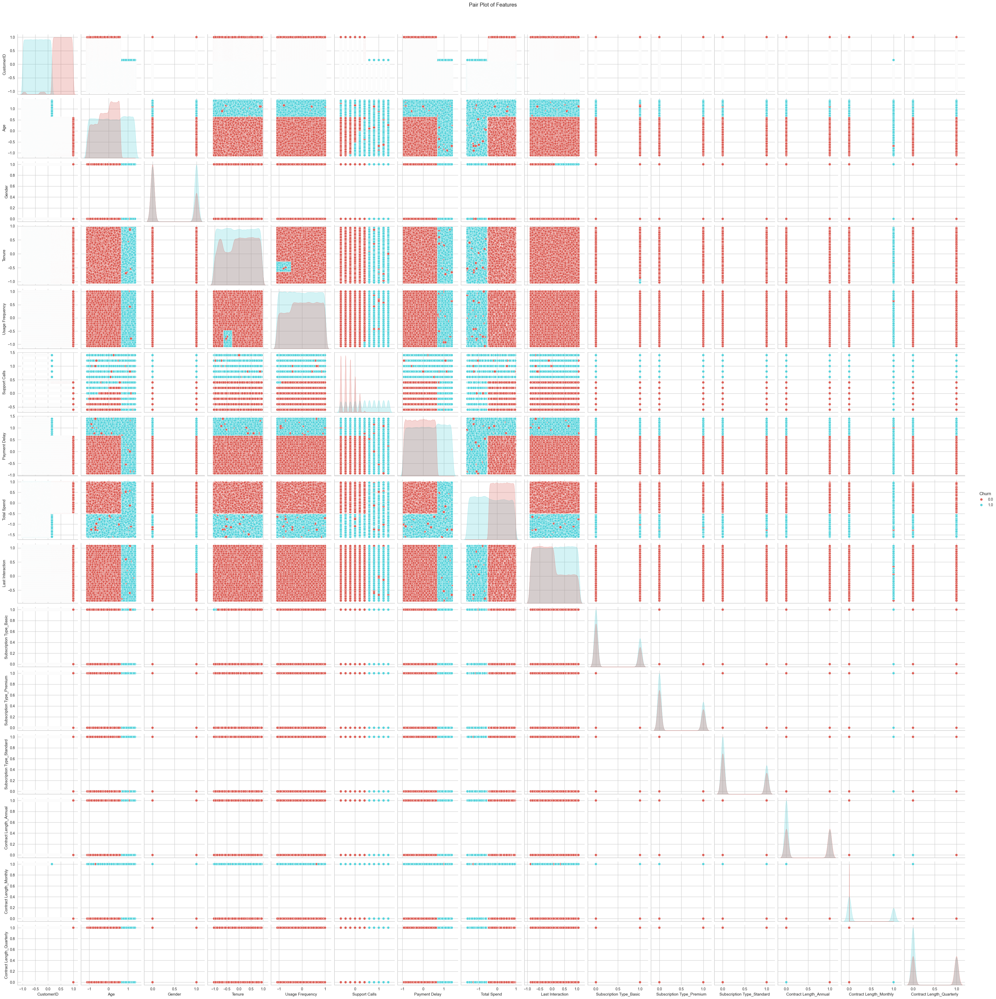

In [60]:
sns.pairplot(data=X_preprocessed_df, hue="Churn", palette="hls")  # Color points by class label

# Add a title (optional)
plt.suptitle("Pair Plot of Features", y=1.02)  # Adjust y-position for title placement
plt.show()

In [ ]:
# If the skewness value is between -0.5 and 0.5, the distribution can be considered approximately symmetric.
# If the skewness value is between -1 and -0.5 (or between 0.5 and 1), the distribution can be considered moderately skewed.
# If the skewness value is less than -1 (or greater than 1), the distribution is highly skewed.
df=X_preprocessed_df.copy()
def skwenwss_check(col):

    # Calculate skewness of the data
    skewness = skew(df[col])
    plt.figure(figsize=(10, 6))

    # Create a histogram with kernel density estimate
    sns.histplot(df[col], kde=True)

    # Overlay mean, median, and mode lines
    mean_val = np.mean(df[col])
    med_val = np.median(df[col])
    mode_val = df[col].mode()[0]

    plt.axvline(mean_val, color='r', linestyle='--', label=f'Mean: {mean_val:.2f}')
    plt.axvline(med_val, color='g', linestyle='--', label=f'Median: {med_val:.2f}')
    plt.axvline(mode_val, color='b', linestyle='--', label=f'Mode: {mode_val:.2f}')

    # Set legend position
    plt.legend(loc='upper left')

    # Add skewness information to the plot
    plt.text(0.95, 0.95, f'Skewness: {skewness:.2f}', ha='right', va='center', transform=plt.gca().transAxes)

    # Set title and labels
    plt.title('Histogram with KDE and Skewness for the column {}'.format(col))
    plt.xlabel('Values')
    plt.ylabel('Frequency')

    # Display the plot
    plt.show()


In [ ]:
skwenwss_check("Age")

In [ ]:
skwenwss_check("Support Calls")

In [ ]:
skwenwss_check("Total Spend")

In [ ]:
skwenwss_check('Payment Delay')

In [ ]:
# Calculate skewness
skewness = df.skew()
print("Skewness of features:")
print(skewness)

# Identify features with skewness above a threshold (e.g., 0.5)
skewed_features = skewness[abs(skewness) > 0.5].index
print("\nSkewed features (|skewness| > 0.5):")
print(skewed_features)

In [ ]:
# Compute the correlation matrix
correlation_matrix = df.corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, fmt=".2f", annot_kws={"size": 10})

# Add title
plt.title('Correlation Heatmap')

# Show plot
plt.show()


## HELPER FUNCTIONS

In [19]:
def preprocess_data(X, y, random_state=gtid()):
    """
    Preprocess the data by one-hot encoding non-binary categorical features, applying SMOTE, and scaling using RobustScaler.
    """
    categorical_features=[]
    # Identify categorical and numerical features
    for col in X.columns:
        if X[col].dtype == 'object' or len(X[col].unique()) < 10:  # Assuming categorical if less than 10 unique values
            categorical_features.append(col)
    
    # Remove binary features from numerical features list
    numerical_features = [col for col in X.columns if col not in categorical_features]

    # Define the preprocessor for the pipeline
    preprocessor = ColumnTransformer(
        transformers=[
            ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features),
            ('num', RobustScaler(), numerical_features)
        ]
    )
    # Apply the preprocessor to X
    X_preprocessed = preprocessor.fit_transform(X)

    # Combine encoded features with the original dataset
    # X_encoded = pd.concat([X.drop(non_binary_categorical_features, axis=1), encoded_df], axis=1)

    
    
    # Apply SMOTE to the preprocessed data
    smote = SMOTE(random_state=random_state)
    X_resampled, y_resampled = smote.fit_resample(X_preprocessed, y)

    return X_resampled, y_resampled.values.ravel()


def tune_hyperparameters(model, param_grid, X_train, y_train, cv=5):
    """
    Tune hyperparameters using GridSearchCV.
    """
    skf = StratifiedKFold(n_splits=cv, shuffle=True, random_state=42)
    grid_search = GridSearchCV(model, param_grid, cv=skf, scoring='f1')
    grid_search.fit(X_train, y_train)
    
    print("Best parameters found: ", grid_search.best_params_)
    return grid_search.best_estimator_, grid_search.best_params_

## Implementing ML Algorithms

In [84]:
x_tr, x_te, y_tr, y_te = load_dataset_1()
x_train, y_train = preprocess_data(x_tr, y_tr)
x_test, y_test = preprocess_data(x_te, y_te)

891


In [89]:
nm = NearMiss(version = 1 , n_neighbors = 10)
x_train, y_train= nm.fit_resample(x_train, y_train)
x_test, y_test= nm.fit_resample(x_test, y_test)

In [85]:
x_tr, x_te, y_tr, y_te = load_dataset_2()
x_train2, y_train2 = preprocess_data(x_tr, y_tr)
x_test2, y_test2= preprocess_data(x_te, y_te)

In [90]:
x_train_, x_val, y_train_, y_val=train_test_split(x_train, y_train, test_size=0.2, random_state=gtid())

In [91]:
x_train2_, x_val2, y_train2_, y_val2=train_test_split(x_train2, y_train2, test_size=0.2, random_state=gtid())


### ANN

In [117]:
# Set a validation fraction (e.g., 10% for validation)
validation_fraction = 0.1

# Create MLPClassifier with early stopping parameters
model = MLPClassifier(hidden_layer_sizes=(100,100), activation='relu',
                      max_iter=200, random_state=gtid(),
                      validation_fraction=validation_fraction,
                      tol=0.001,  # Tolerance for stopping (adjust as needed)
                      early_stopping=True)

#### Learning Rate

##### Data 1: Diabetes

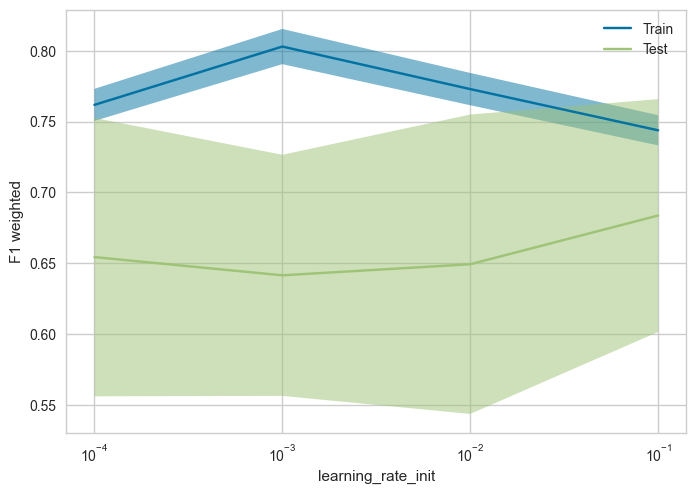

In [93]:
param_range = [0.0001, 0.001, 0.01, 0.1]
ValidationCurveDisplay.from_estimator(
model, x_train, y_train, param_name="learning_rate_init", param_range=param_range, scoring='f1_weighted'
)

##### Data 2: Churn

In [118]:
param_range = [0.0001, 0.001, 0.01, 0.1]
ValidationCurveDisplay.from_estimator(
model, x_train2, y_train2, param_name="learning_rate_init", param_range=param_range, scoring='accuracy'
)

#### Hidden Layers/Nodes

##### Data 1: Diabetes

In [95]:
param_range =  [(10,), (50,), (100,),(50, 50), (100, 100), (50, 50, 50)]
param_grid = {'hidden_layer_sizes': param_range}
grid_search = GridSearchCV(model, param_grid, scoring='f1_weighted')
grid_search.fit(x_train, y_train)
best_layer = grid_search.best_params_['hidden_layer_sizes']


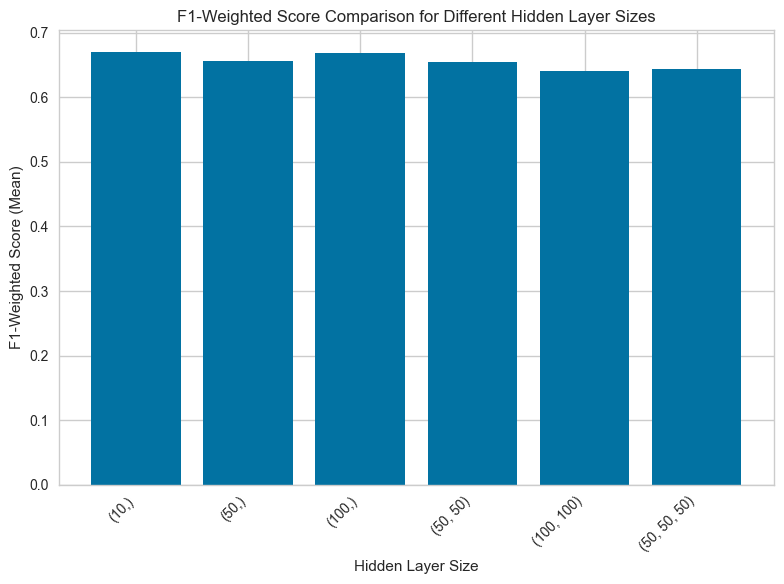

In [96]:
cv_results = grid_search.cv_results_
mean_scores = list(cv_results['mean_test_score'])
activation_functions = [str(i['hidden_layer_sizes']) for i in cv_results['params']]

activation_scores=[]
for i, activation in enumerate(activation_functions):
    activation_scores.append(mean_scores[i]) # Assuming single scoring metric

# Create the bar chart
plt.figure(figsize=(8, 6))
plt.bar(activation_functions, activation_scores)
plt.xlabel('Hidden Layer Size')
plt.ylabel('F1-Weighted Score (Mean)')
plt.title('F1-Weighted Score Comparison for Different Hidden Layer Sizes')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

##### Data 2: Churn

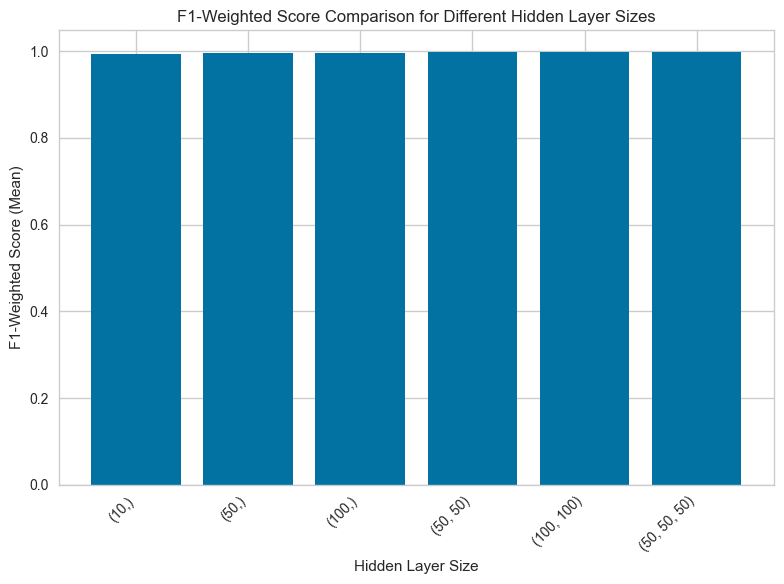

In [97]:
# param_range =  [(10,), (50,), (100,), (50, 50), (100, 100)]
param_range =  [(10,), (50,), (100,),(50, 50), (100, 100), (50, 50, 50)]
param_grid = {'hidden_layer_sizes': param_range}
grid_search = GridSearchCV(model, param_grid, scoring='f1_weighted')
grid_search.fit(x_train2, y_train2)
best_layer = grid_search.best_params_['hidden_layer_sizes']
cv_results = grid_search.cv_results_
mean_scores = list(cv_results['mean_test_score'])
activation_functions = [str(i['hidden_layer_sizes']) for i in cv_results['params']]

activation_scores=[]
for i, activation in enumerate(activation_functions):
    activation_scores.append(mean_scores[i]) # Assuming single scoring metric

# Create the bar chart
plt.figure(figsize=(8, 6))
plt.bar(activation_functions, activation_scores)
plt.xlabel('Hidden Layer Size')
plt.ylabel('F1-Weighted Score (Mean)')
plt.title('F1-Weighted Score Comparison for Different Hidden Layer Sizes')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


#### Activation Function

##### Data 1: Diabetes

In [98]:
param_grid = {'activation': ['identity', 'logistic', 'tanh', 'relu']}
grid_search = GridSearchCV(model, param_grid, scoring='f1_weighted')
grid_search.fit(x_train, y_train)
best_activation = grid_search.best_params_['activation']

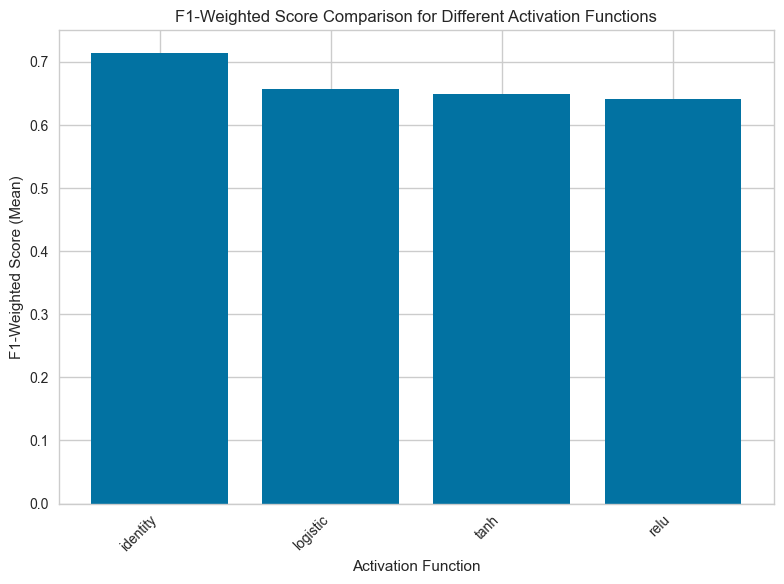

In [99]:


# Extract the F1-weighted scores for each activation function
# (assuming GridSearchCV stores them in the 'cv_results_' attribute)
cv_results = grid_search.cv_results_
mean_scores = list(cv_results['mean_test_score'])
activation_functions = [i['activation'] for i in cv_results['params']]

activation_scores=[]
for i, activation in enumerate(activation_functions):
    activation_scores.append(mean_scores[i]) # Assuming single scoring metric

# Create the bar chart
plt.figure(figsize=(8, 6))
plt.bar(activation_functions, activation_scores)
plt.xlabel('Activation Function')
plt.ylabel('F1-Weighted Score (Mean)')
plt.title('F1-Weighted Score Comparison for Different Activation Functions')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

##### Data 2: Churn

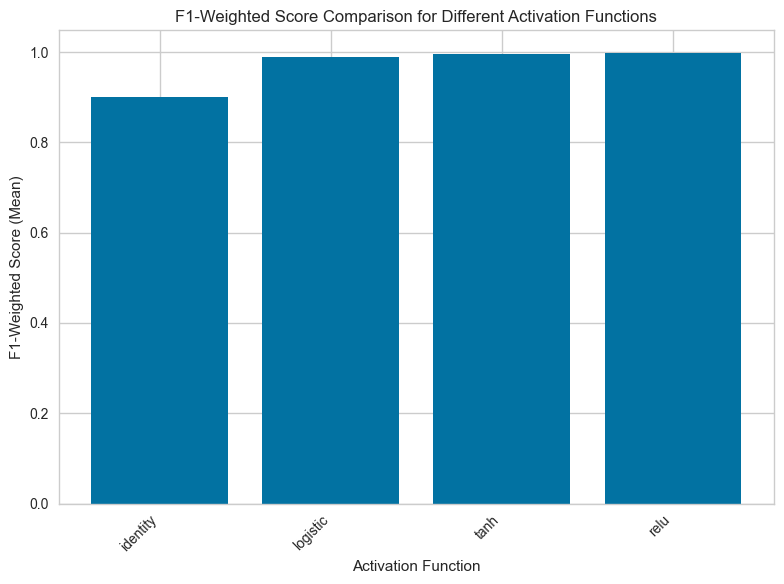

In [100]:
param_grid = {'activation': ['identity', 'logistic', 'tanh', 'relu']}
grid_search = GridSearchCV(model, param_grid, scoring='f1_weighted')
grid_search.fit(x_train2, y_train2)
best_activation = grid_search.best_params_['activation']


# Extract the F1-weighted scores for each activation function
cv_results = grid_search.cv_results_
mean_scores = list(cv_results['mean_test_score'])
activation_functions = [i['activation'] for i in cv_results['params']]

activation_scores=[]
for i, activation in enumerate(activation_functions):
    activation_scores.append(mean_scores[i]) # Assuming single scoring metric

# Create the bar chart
plt.figure(figsize=(8, 6))
plt.bar(activation_functions, activation_scores)
plt.xlabel('Activation Function')
plt.ylabel('F1-Weighted Score (Mean)')
plt.title('F1-Weighted Score Comparison for Different Activation Functions')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

#### Best Model Metrics

##### Data 1: Diabetes

In [107]:
best_layer = (100,100)
best_activation = 'identity'
lr = 0.001
best_mlp = MLPClassifier(hidden_layer_sizes=best_layer, 
                         activation=best_activation, 
                         learning_rate_init=lr, 
                         max_iter=200, 
                         random_state=42,  
                        #  tol=0.0001,  # Tolerance for stopping (adjust as needed)
                         early_stopping=True)

best_mlp.fit(x_train_, y_train_)  # Pass the callback to fit


MLPClassifier(early_stopping=True, hidden_layer_sizes=(100, 100),
              random_state=42)

In [ ]:
common_params = {
    "X": x_train,
    "y": y_train,
    "train_sizes": np.linspace(0.1, 1.0, 5),
    "cv": 5,
    "score_type": "both",
    "n_jobs": 4,
    "line_kw": {"marker": "o"},
    "std_display_style": "fill_between",
    "score_name": "f1_weighted",
}

LearningCurveDisplay.from_estimator(best_mlp, **common_params)

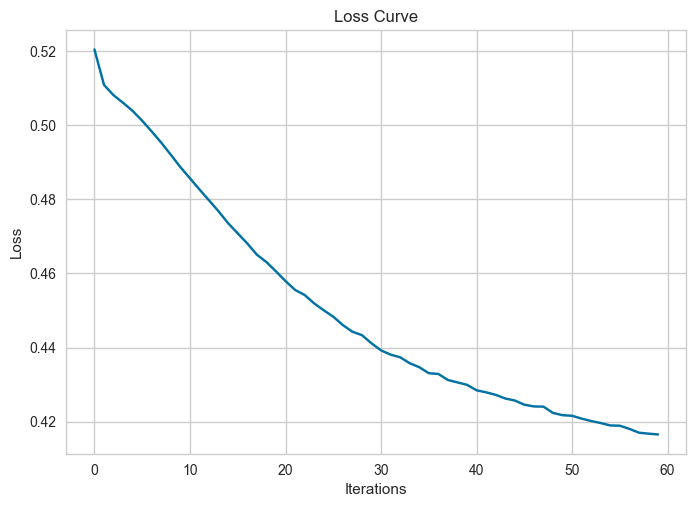

In [108]:
# Plot loss curve
plt.plot(best_mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [109]:
# Evaluate on the test set
y_val_pred = best_mlp.predict(x_val)
print("Val Set Evaluation:")
print("F1 Score: ", f1_score(y_val, y_val_pred, average='weighted'))
print("Accuracy: ", accuracy_score(y_val, y_val_pred))
print("Precision: ", precision_score(y_val, y_val_pred, average='weighted'))
print("Recall: ", recall_score(y_val, y_val_pred, average='weighted'))
print("ROC AUC: ", roc_auc_score(y_val, y_val_pred))


Val Set Evaluation:
F1 Score:  0.7858314808211566
Accuracy:  0.786312826698834
Precision:  0.7887202775535636
Recall:  0.786312826698834
ROC AUC:  0.7861919465434678


In [110]:
best_mlp.fit(x_train, y_train)

# Evaluate on the test set
y_test_pred = best_mlp.predict(x_test)
print("Test Set Evaluation:")
print("F1 Score: ", f1_score(y_test, y_test_pred, average='weighted'))
print("Accuracy: ", accuracy_score(y_test, y_test_pred))
print("Precision: ", precision_score(y_test, y_test_pred, average='weighted'))
print("Recall: ", recall_score(y_test, y_test_pred, average='weighted'))
print("ROC AUC: ", roc_auc_score(y_test, y_test_pred))


Test Set Evaluation:
F1 Score:  0.7652211409275733
Accuracy:  0.7652217457178809
Precision:  0.7652244785907578
Recall:  0.7652217457178809
ROC AUC:  0.7652217457178809


Test Set Evaluation:
F1 Score:  0.7592498430709279
Accuracy:  0.7593984962406015
Precision:  0.7600407534709328
Recall:  0.7593984962406015
ROC AUC:  0.7593984962406016


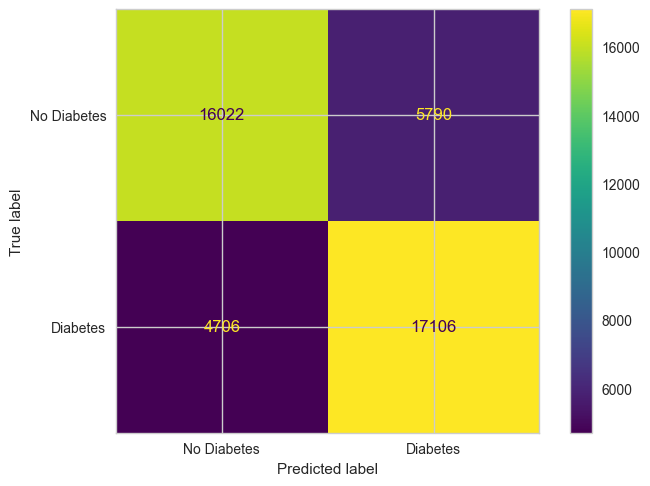

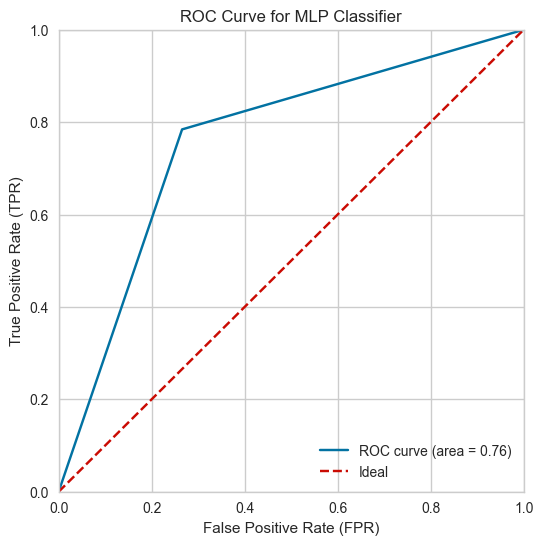

In [133]:
best_mlp.fit(x_train, y_train)

# Evaluate on the test set
y_test_pred = best_mlp.predict(x_test)
print("Test Set Evaluation:")
print("F1 Score: ", f1_score(y_test, y_test_pred, average='weighted'))
print("Accuracy: ", accuracy_score(y_test, y_test_pred))
print("Precision: ", precision_score(y_test, y_test_pred, average='weighted'))
print("Recall: ", recall_score(y_test, y_test_pred, average='weighted'))
print("ROC AUC: ", roc_auc_score(y_test, y_test_pred))

# Plot confusion matrix
cm = confusion_matrix(y_test, y_test_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Diabetes', 'Diabetes'])
disp.plot()
plt.show()


# Calculate ROC curve
fpr, tpr, _ = roc_curve(y_test, y_test_pred)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'r--', label='Ideal')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve for MLP Classifier')
plt.legend(loc="lower right")
plt.show()



##### Data 2: Churn

In [28]:
lr = 0.001
best_mlp = MLPClassifier(hidden_layer_sizes=best_layer, 
                         activation=best_activation, 
                         learning_rate_init=lr, 
                        #  max_iter=200, 
                         random_state=42,  
                         tol=0.001,  # Tolerance for stopping (adjust as needed)
                         early_stopping=True)
best_mlp.fit(x_train2_, y_train2_)

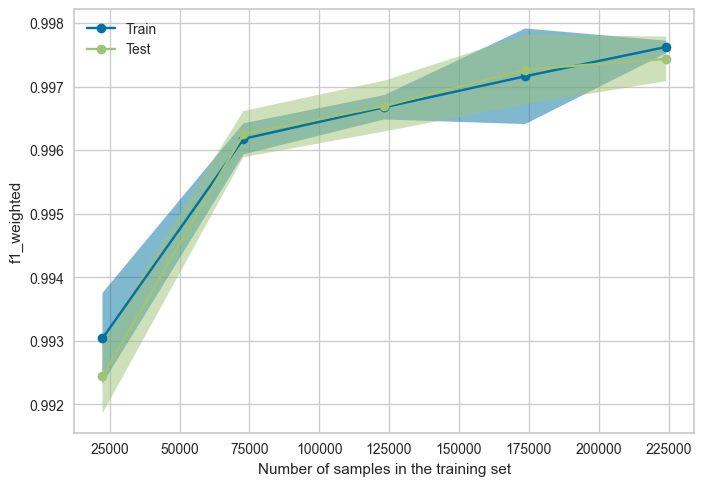

In [29]:
common_params = {
    "X": x_train2,
    "y": y_train2,
    "train_sizes": np.linspace(0.1, 1.0, 5),
    "cv": 5,
    "score_type": "both",
    "n_jobs": 4,
    "line_kw": {"marker": "o"},
    "std_display_style": "fill_between",
    "score_name": "f1_weighted",
}

LearningCurveDisplay.from_estimator(best_mlp, **common_params)

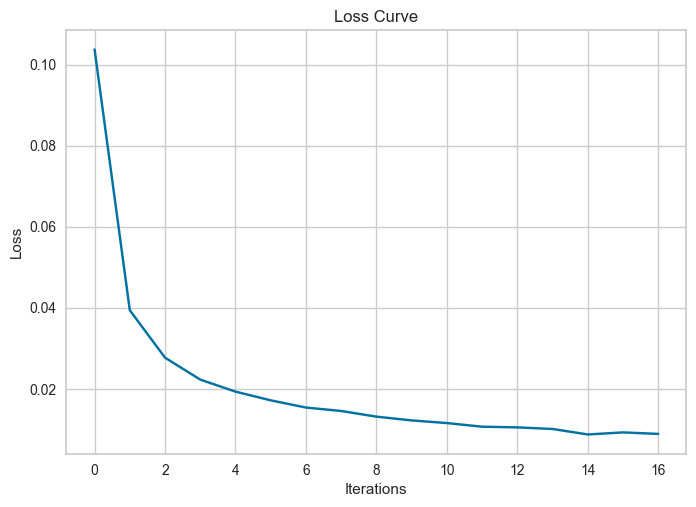

In [33]:
# Plot loss curve
plt.plot(best_mlp.loss_curve_)
plt.title('Loss Curve')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

In [34]:
# Evaluate on the test set
y_val_pred2 = best_mlp.predict(x_val2)
print("Val Set Evaluation:")
print("F1 Score: ", f1_score(y_val2, y_val_pred2, average='weighted'))
print("Accuracy: ", accuracy_score(y_val2, y_val_pred2))
print("Precision: ", precision_score(y_val2, y_val_pred2, average='weighted'))
print("Recall: ", recall_score(y_val2, y_val_pred2, average='weighted'))
print("ROC AUC: ", roc_auc_score(y_val2, y_val_pred2))

Val Set Evaluation:
F1 Score:  0.9976978007475104
Accuracy:  0.9976978263197345
Precision:  0.9977032721262463
Recall:  0.9976978263197345
ROC AUC:  0.9976894150610737


Test Set Evaluation:
F1 Score:  0.9980070479697402
Accuracy:  0.998007054167981
Precision:  0.9980132496129053
Recall:  0.998007054167981
ROC AUC:  0.998007054167981


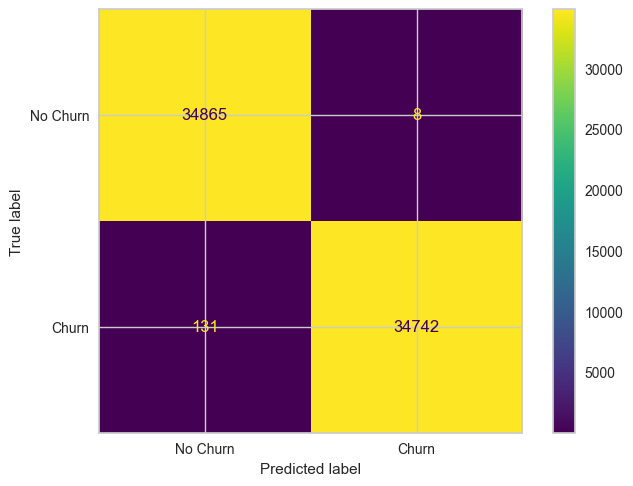

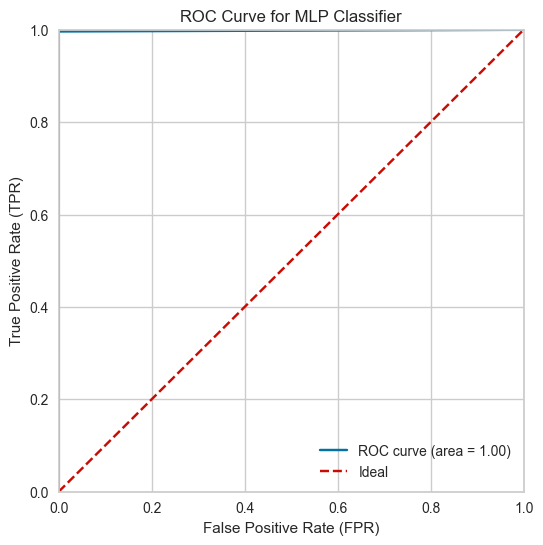

In [35]:
best_mlp.fit(x_train2, y_train2)
# Evaluate on the test set
y_test_pred2 = best_mlp.predict(x_test2)
print("Test Set Evaluation:")
print("F1 Score: ", f1_score(y_test2, y_test_pred2, average='weighted'))
print("Accuracy: ", accuracy_score(y_test2, y_test_pred2))
print("Precision: ", precision_score(y_test2, y_test_pred2, average='weighted'))
print("Recall: ", recall_score(y_test2, y_test_pred2, average='weighted'))
print("ROC AUC: ", roc_auc_score(y_test2, y_test_pred2))

# Plot confusion matrix
cm = confusion_matrix(y_test2, y_test_pred2)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Churn', 'Churn'])
disp.plot()
plt.show()

# Calculate ROC curve
fpr, tpr, _ = roc_curve(y_test2, y_test_pred2)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'r--', label='Ideal')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve for MLP Classifier')
plt.legend(loc="lower right")
plt.show()


### SVM

In [98]:
# Create MLPClassifier with early stopping parameters
svm_model = SVC(kernel='rbf',
                      max_iter=100, random_state=gtid(),
                      tol=0.001,  # Tolerance for stopping (adjust as needed)
                      class_weight='balanced')

#### Kernel

##### Data 1: Diabetes

c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
c:\Users\Use

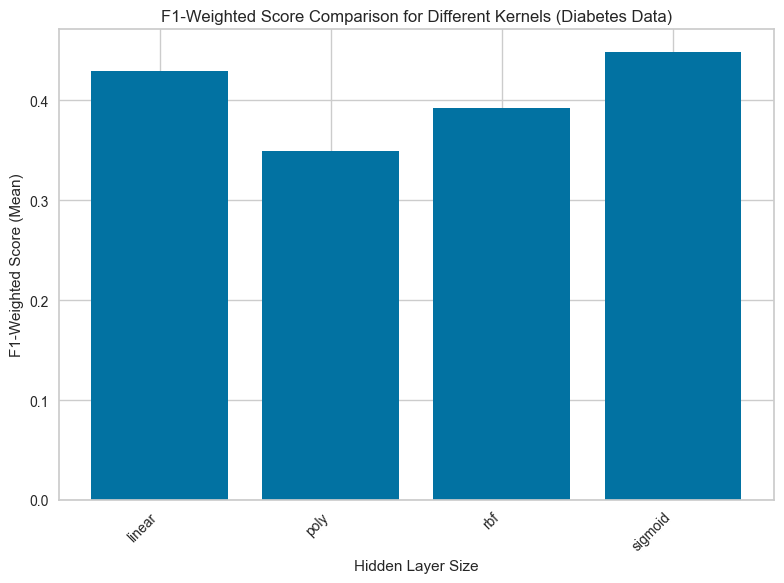

In [99]:
param_range = ['linear', 'poly', 'rbf', 'sigmoid']
param_grid = {'kernel': param_range}
grid_search = GridSearchCV(svm_model, param_grid, scoring='f1_weighted')
grid_search.fit(x_train, y_train)
best_kernel = grid_search.best_params_['kernel']
cv_results = grid_search.cv_results_
mean_scores = list(cv_results['mean_test_score'])
activation_functions = [str(i['kernel']) for i in cv_results['params']]

activation_scores=[]
for i, activation in enumerate(activation_functions):
    activation_scores.append(mean_scores[i]) # Assuming single scoring metric

# Create the bar chart
plt.figure(figsize=(8, 6))
plt.bar(activation_functions, activation_scores)
plt.xlabel('Hidden Layer Size')
plt.ylabel('F1-Weighted Score (Mean)')
plt.title('F1-Weighted Score Comparison for Different Kernels (Diabetes Data)')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

##### Data 2: Churn

c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
c:\Users\Use

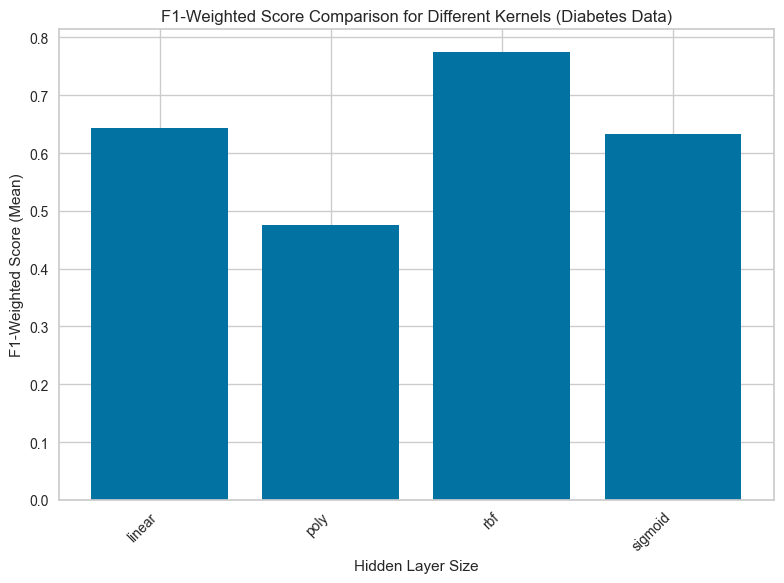

In [38]:
param_range = ['linear', 'poly', 'rbf', 'sigmoid']
param_grid = {'kernel': param_range}
grid_search = GridSearchCV(svm_model, param_grid, scoring='f1_weighted')
grid_search.fit(x_train2, y_train2)
best_kernel2 = grid_search.best_params_['kernel']
cv_results = grid_search.cv_results_
mean_scores = list(cv_results['mean_test_score'])
activation_functions = [str(i['kernel']) for i in cv_results['params']]

activation_scores=[]
for i, activation in enumerate(activation_functions):
    activation_scores.append(mean_scores[i]) # Assuming single scoring metric

# Create the bar chart
plt.figure(figsize=(8, 6))
plt.bar(activation_functions, activation_scores)
plt.xlabel('Hidden Layer Size')
plt.ylabel('F1-Weighted Score (Mean)')
plt.title('F1-Weighted Score Comparison for Different Kernels (Diabetes Data)')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

#### Best Model

##### Data 1: Diabetes

In [13]:
grid_params = {'C': 1000, 'gamma': 0.001, 'kernel': 'sigmoid'}

In [26]:
best_svm = SVC(kernel=grid_params['kernel'],
               C=grid_params['C'],
               gamma=grid_params['gamma'],
                      max_iter=500, random_state=gtid(),
                      tol=0.001,  # Tolerance for stopping (adjust as needed)
                      class_weight='balanced')

c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=500).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


SVC(C=1000, class_weight='balanced', gamma=0.001, kernel='sigmoid',
    max_iter=500, random_state=903952938)

In [ ]:
# defining parameter range 
param_grid = {'C': [0.1, 1, 10, 100, 1000],  
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 
              'kernel': [best_kernel]}  
  
grid = GridSearchCV(best_svm, param_grid, refit = True, verbose = 0) 
  
# fitting the model for grid search 
grid.fit(x_train2_, y_train2_) 

In [146]:
grid_params = grid.best_params_
best_svm = SVC(kernel=grid_params['kernel'],
               C=grid_params['C'],
               gamma=grid_params['gamma'],
                      max_iter=500, random_state=gtid(),
                      tol=0.001,  # Tolerance for stopping (adjust as needed)
                      class_weight='balanced')
best_svm.fit(x_train_, y_train_)

Fitting 5 folds for each of 25 candidates, totalling 125 fits


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   6.6s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   6.6s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   6.6s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   6.8s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   6.5s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=   5.1s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=   5.2s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=   5.1s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=   5.1s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...................C=0.1, gamma=0.1, kernel=sigmoid; total time=   5.1s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=0.1, gamma=0.01, kernel=sigmoid; total time=   5.1s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=0.1, gamma=0.01, kernel=sigmoid; total time=   5.0s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=0.1, gamma=0.01, kernel=sigmoid; total time=   5.0s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=0.1, gamma=0.01, kernel=sigmoid; total time=   5.1s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=0.1, gamma=0.01, kernel=sigmoid; total time=   5.0s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .................C=0.1, gamma=0.001, kernel=sigmoid; total time=   4.9s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .................C=0.1, gamma=0.001, kernel=sigmoid; total time=   5.1s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .................C=0.1, gamma=0.001, kernel=sigmoid; total time=   5.0s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .................C=0.1, gamma=0.001, kernel=sigmoid; total time=   5.0s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .................C=0.1, gamma=0.001, kernel=sigmoid; total time=   5.3s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ................C=0.1, gamma=0.0001, kernel=sigmoid; total time=   5.2s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ................C=0.1, gamma=0.0001, kernel=sigmoid; total time=   5.3s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ................C=0.1, gamma=0.0001, kernel=sigmoid; total time=   5.2s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ................C=0.1, gamma=0.0001, kernel=sigmoid; total time=   5.0s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ................C=0.1, gamma=0.0001, kernel=sigmoid; total time=   5.2s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .......................C=1, gamma=1, kernel=sigmoid; total time=   6.6s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .......................C=1, gamma=1, kernel=sigmoid; total time=   6.6s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .......................C=1, gamma=1, kernel=sigmoid; total time=   6.3s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .......................C=1, gamma=1, kernel=sigmoid; total time=   9.9s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .......................C=1, gamma=1, kernel=sigmoid; total time=  15.1s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .....................C=1, gamma=0.1, kernel=sigmoid; total time=  13.9s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .....................C=1, gamma=0.1, kernel=sigmoid; total time=  12.9s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .....................C=1, gamma=0.1, kernel=sigmoid; total time=  12.9s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .....................C=1, gamma=0.1, kernel=sigmoid; total time=  13.2s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .....................C=1, gamma=0.1, kernel=sigmoid; total time=  13.3s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ....................C=1, gamma=0.01, kernel=sigmoid; total time=  13.9s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ....................C=1, gamma=0.01, kernel=sigmoid; total time=  13.3s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ....................C=1, gamma=0.01, kernel=sigmoid; total time=  12.8s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ....................C=1, gamma=0.01, kernel=sigmoid; total time=  13.3s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ....................C=1, gamma=0.01, kernel=sigmoid; total time=  13.9s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...................C=1, gamma=0.001, kernel=sigmoid; total time=  13.7s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...................C=1, gamma=0.001, kernel=sigmoid; total time=  13.7s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...................C=1, gamma=0.001, kernel=sigmoid; total time=  13.5s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...................C=1, gamma=0.001, kernel=sigmoid; total time=  13.1s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...................C=1, gamma=0.001, kernel=sigmoid; total time=  13.5s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=1, gamma=0.0001, kernel=sigmoid; total time=  13.1s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=1, gamma=0.0001, kernel=sigmoid; total time=  13.3s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=1, gamma=0.0001, kernel=sigmoid; total time=  12.1s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=1, gamma=0.0001, kernel=sigmoid; total time=  12.2s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=1, gamma=0.0001, kernel=sigmoid; total time=  12.3s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ......................C=10, gamma=1, kernel=sigmoid; total time=  14.8s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ......................C=10, gamma=1, kernel=sigmoid; total time=  14.6s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ......................C=10, gamma=1, kernel=sigmoid; total time=  14.2s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ......................C=10, gamma=1, kernel=sigmoid; total time=  14.8s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ......................C=10, gamma=1, kernel=sigmoid; total time=  14.8s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ....................C=10, gamma=0.1, kernel=sigmoid; total time=   6.9s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ....................C=10, gamma=0.1, kernel=sigmoid; total time=   4.6s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ....................C=10, gamma=0.1, kernel=sigmoid; total time=   4.4s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ....................C=10, gamma=0.1, kernel=sigmoid; total time=   4.5s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ....................C=10, gamma=0.1, kernel=sigmoid; total time=   4.5s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...................C=10, gamma=0.01, kernel=sigmoid; total time=   5.3s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...................C=10, gamma=0.01, kernel=sigmoid; total time=   5.5s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...................C=10, gamma=0.01, kernel=sigmoid; total time=   5.4s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...................C=10, gamma=0.01, kernel=sigmoid; total time=   5.3s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...................C=10, gamma=0.01, kernel=sigmoid; total time=   5.4s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=10, gamma=0.001, kernel=sigmoid; total time=   5.1s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=10, gamma=0.001, kernel=sigmoid; total time=   5.2s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=10, gamma=0.001, kernel=sigmoid; total time=   5.2s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=10, gamma=0.001, kernel=sigmoid; total time=   5.2s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=10, gamma=0.001, kernel=sigmoid; total time=   5.2s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .................C=10, gamma=0.0001, kernel=sigmoid; total time=   5.2s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .................C=10, gamma=0.0001, kernel=sigmoid; total time=   5.2s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .................C=10, gamma=0.0001, kernel=sigmoid; total time=   5.0s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .................C=10, gamma=0.0001, kernel=sigmoid; total time=   5.1s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .................C=10, gamma=0.0001, kernel=sigmoid; total time=   5.2s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .....................C=100, gamma=1, kernel=sigmoid; total time=   6.6s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .....................C=100, gamma=1, kernel=sigmoid; total time=   6.5s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .....................C=100, gamma=1, kernel=sigmoid; total time=   6.4s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .....................C=100, gamma=1, kernel=sigmoid; total time=   6.5s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .....................C=100, gamma=1, kernel=sigmoid; total time=   6.5s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...................C=100, gamma=0.1, kernel=sigmoid; total time=   4.4s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...................C=100, gamma=0.1, kernel=sigmoid; total time=   4.4s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...................C=100, gamma=0.1, kernel=sigmoid; total time=   4.3s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...................C=100, gamma=0.1, kernel=sigmoid; total time=   4.4s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...................C=100, gamma=0.1, kernel=sigmoid; total time=   4.3s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=100, gamma=0.01, kernel=sigmoid; total time=   6.2s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=100, gamma=0.01, kernel=sigmoid; total time=   6.2s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=100, gamma=0.01, kernel=sigmoid; total time=   6.2s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=100, gamma=0.01, kernel=sigmoid; total time=   6.2s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=100, gamma=0.01, kernel=sigmoid; total time=   6.1s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .................C=100, gamma=0.001, kernel=sigmoid; total time=   5.3s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .................C=100, gamma=0.001, kernel=sigmoid; total time=   5.5s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .................C=100, gamma=0.001, kernel=sigmoid; total time=   5.2s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .................C=100, gamma=0.001, kernel=sigmoid; total time=   5.4s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .................C=100, gamma=0.001, kernel=sigmoid; total time=   5.4s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ................C=100, gamma=0.0001, kernel=sigmoid; total time=   5.1s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ................C=100, gamma=0.0001, kernel=sigmoid; total time=   5.1s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ................C=100, gamma=0.0001, kernel=sigmoid; total time=   5.1s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ................C=100, gamma=0.0001, kernel=sigmoid; total time=   5.2s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ................C=100, gamma=0.0001, kernel=sigmoid; total time=   5.1s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ....................C=1000, gamma=1, kernel=sigmoid; total time=   6.5s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ....................C=1000, gamma=1, kernel=sigmoid; total time=   6.5s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ....................C=1000, gamma=1, kernel=sigmoid; total time=   6.5s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ....................C=1000, gamma=1, kernel=sigmoid; total time=   6.5s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ....................C=1000, gamma=1, kernel=sigmoid; total time=   6.5s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=1000, gamma=0.1, kernel=sigmoid; total time=   4.5s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=1000, gamma=0.1, kernel=sigmoid; total time=   4.5s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=1000, gamma=0.1, kernel=sigmoid; total time=   4.4s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=1000, gamma=0.1, kernel=sigmoid; total time=   4.3s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ..................C=1000, gamma=0.1, kernel=sigmoid; total time=   4.5s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .................C=1000, gamma=0.01, kernel=sigmoid; total time=   5.9s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .................C=1000, gamma=0.01, kernel=sigmoid; total time=   5.8s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .................C=1000, gamma=0.01, kernel=sigmoid; total time=   6.0s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .................C=1000, gamma=0.01, kernel=sigmoid; total time=   5.7s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END .................C=1000, gamma=0.01, kernel=sigmoid; total time=   5.7s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ................C=1000, gamma=0.001, kernel=sigmoid; total time=   6.1s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ................C=1000, gamma=0.001, kernel=sigmoid; total time=   6.1s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ................C=1000, gamma=0.001, kernel=sigmoid; total time=   6.2s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ................C=1000, gamma=0.001, kernel=sigmoid; total time=   6.6s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ................C=1000, gamma=0.001, kernel=sigmoid; total time=   6.3s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...............C=1000, gamma=0.0001, kernel=sigmoid; total time=   5.3s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...............C=1000, gamma=0.0001, kernel=sigmoid; total time=   5.5s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...............C=1000, gamma=0.0001, kernel=sigmoid; total time=   5.4s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...............C=1000, gamma=0.0001, kernel=sigmoid; total time=   5.5s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


[CV] END ...............C=1000, gamma=0.0001, kernel=sigmoid; total time=   5.6s


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


GridSearchCV(estimator=SVC(class_weight='balanced', kernel='sigmoid',
                           max_iter=1000, random_state=903952938),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['sigmoid']},
             verbose=2)

In [151]:
common_params = {
    "X": x_train,
    "y": y_train,
    "train_sizes": np.linspace(0.1, 1.0, 5),
    "cv": 5,
    "score_type": "both",
    "n_jobs": 4,
    "line_kw": {"marker": "o"},
    "std_display_style": "fill_between",
    "score_name": "f1_weighted",
}

LearningCurveDisplay.from_estimator(best_svm, **common_params)

{'C': 1000, 'gamma': 0.001, 'kernel': 'sigmoid'}

In [28]:
# Evaluate on the test set
y_val_pred = best_svm.predict(x_val)
print("Val Set Evaluation:")
print("F1 Score: ", f1_score(y_val, y_val_pred, average='weighted'))
print("Accuracy: ", accuracy_score(y_val, y_val_pred))
print("Precision: ", precision_score(y_val, y_val_pred, average='weighted'))
print("Recall: ", recall_score(y_val, y_val_pred, average='weighted'))
print("ROC AUC: ", roc_auc_score(y_val, y_val_pred))

Val Set Evaluation:
F1 Score:  0.44460582561657735
Accuracy:  0.5399366247572319
Precision:  0.6314532624076571
Recall:  0.5399366247572319
ROC AUC:  0.5410131498205293


In [ ]:
# Evaluate on the test set
y_test_pred = best_svm.predict(x_test)
print("Test Set Evaluation:")
print("F1 Score: ", f1_score(y_test, y_test_pred, average='weighted'))
print("Accuracy: ", accuracy_score(y_test, y_test_pred))
print("Precision: ", precision_score(y_test, y_test_pred, average='weighted'))
print("Recall: ", recall_score(y_test, y_test_pred, average='weighted'))
print("ROC AUC: ", roc_auc_score(y_test, y_test_pred))

# Plot confusion matrix
cm = confusion_matrix(y_test, y_test_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Diabetes', 'Diabetes'])
disp.plot()
plt.show()

# Calculate ROC curve
fpr, tpr, _ = roc_curve(y_test, y_test_pred)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'r--', label='Ideal')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve for SVM Classifier - dataset1')
plt.legend(loc="lower right")
plt.show()


##### Data 2: Churn

In [56]:
# You can choose the best hyperparameters based on the plots and then finalize your model
best_svm = SVC(kernel=best_kernel2,
              #  C=grid.best_params_['C'],
              #  gamma=grid.best_params_['gamma'],
                      max_iter=1000, random_state=gtid(),
                      tol=0.001,  # Tolerance for stopping (adjust as needed)
                      class_weight='balanced')
best_svm.fit(x_train2_, y_train2_)

c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


SVC(C=1, class_weight='balanced', gamma=0.1, max_iter=1000,
    random_state=903952938)

In [ ]:
# defining parameter range 
param_grid = {'C': [0.1, 1, 10, 100, 1000],  
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 
              'kernel': [best_kernel2]}  
  
grid = GridSearchCV(best_svm, param_grid, refit = True, verbose = 1) 
  
# fitting the model for grid search 
grid.fit(x_train2_, y_train2_) 

In [ ]:
best_svm = SVC(kernel=best_kernel2,
               C=grid.best_params_['C'],
               gamma=grid.best_params_['gamma'],
                      max_iter=1000, random_state=gtid(),
                      tol=0.001,  # Tolerance for stopping (adjust as needed)
                      class_weight='balanced')
best_svm.fit(x_train2_, y_train2_)

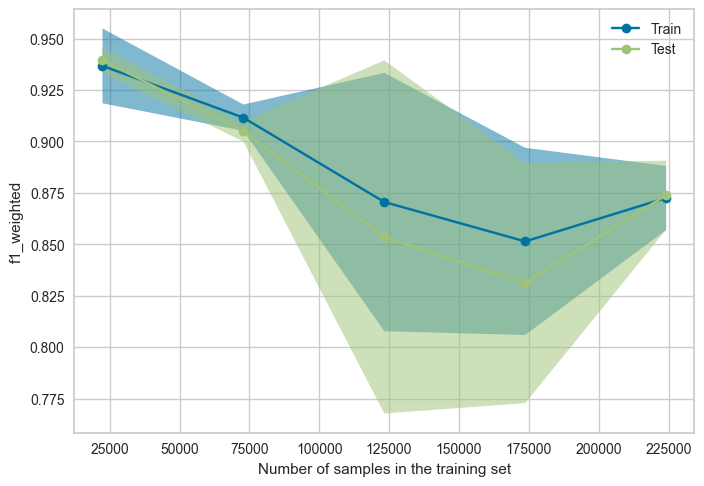

In [58]:
common_params = {
    "X": x_train2,
    "y": y_train2,
    "train_sizes": np.linspace(0.1, 1.0, 5),
    "cv": 5,
    "score_type": "both",
    "n_jobs": 4,
    "line_kw": {"marker": "o"},
    "std_display_style": "fill_between",
    "score_name": "f1_weighted",
}

LearningCurveDisplay.from_estimator(best_svm, **common_params)

In [59]:
# Evaluate on the test set
y_val_pred2 = best_svm.predict(x_val2)
print("Val Set Evaluation:")
print("F1 Score: ", f1_score(y_val2, y_val_pred2, average='weighted'))
print("Accuracy: ", accuracy_score(y_val2, y_val_pred2))
print("Precision: ", precision_score(y_val2, y_val_pred2, average='weighted'))
print("Recall: ", recall_score(y_val2, y_val_pred2, average='weighted'))
print("ROC AUC: ", roc_auc_score(y_val2, y_val_pred2))

Val Set Evaluation:
F1 Score:  0.9034240141706901
Accuracy:  0.9035942463504301
Precision:  0.9068690678820938
Recall:  0.9035942463504301
ROC AUC:  0.9038161665507383


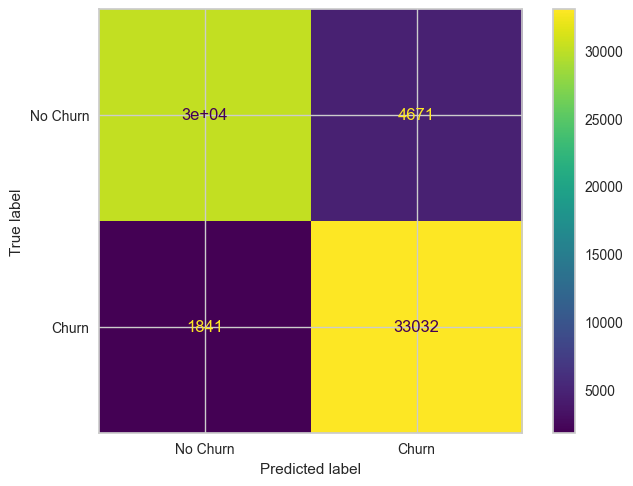

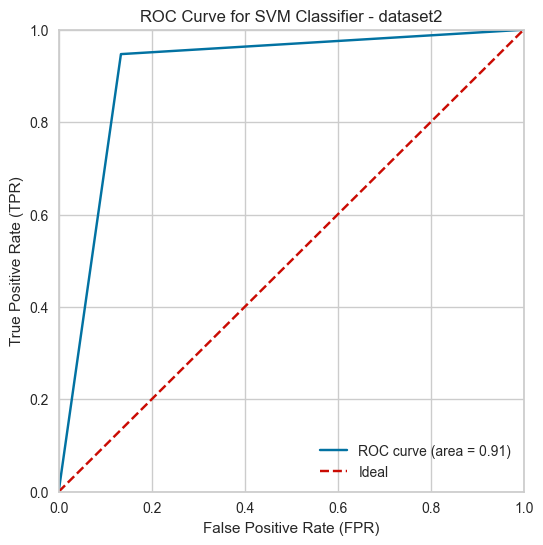

In [63]:
# Evaluate on the test set
y_test_pred2 = best_svm.predict(x_test2)
print("Test Set Evaluation:")
print("F1 Score: ", f1_score(y_test2, y_test_pred2, average='weighted'))
print("Accuracy: ", accuracy_score(y_test2, y_test_pred2))
print("Precision: ", precision_score(y_test2, y_test_pred2, average='weighted'))
print("Recall: ", recall_score(y_test2, y_test_pred2, average='weighted'))
print("ROC AUC: ", roc_auc_score(y_test2, y_test_pred2))

# Plot confusion matrix
cm = confusion_matrix(y_test2, y_test_pred2)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Churn', 'Churn'])
disp.plot()
plt.show()

# Calculate ROC curve
fpr, tpr, _ = roc_curve(y_test2, y_test_pred2)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'r--', label='Ideal')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve for SVM Classifier - dataset2')
plt.legend(loc="lower right")
plt.show()


### KNN

In [135]:
model_knn = KNeighborsClassifier(
    n_neighbors=5, 
    leaf_size=30)

In [136]:
neighbour_params= range(2, 8, 1)
leaf_params= range(3, 30, 3)

##### Data 1: Diabetes

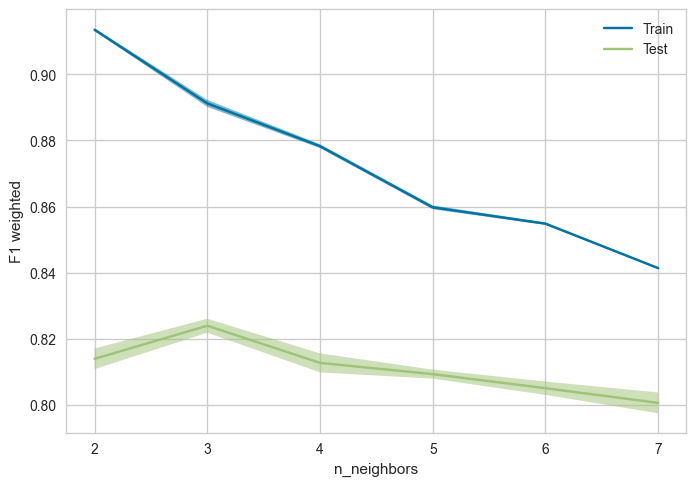

In [137]:
ValidationCurveDisplay.from_estimator(
model_knn, x_train_, y_train_, param_name="n_neighbors", param_range=neighbour_params, scoring='f1_weighted'
)

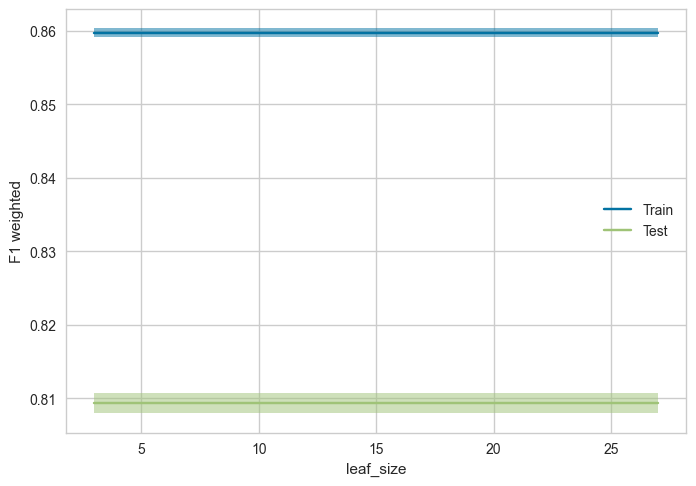

In [143]:
ValidationCurveDisplay.from_estimator(
model_knn, x_train_, y_train_, param_name="leaf_size", param_range=leaf_params, scoring='f1_weighted'
)

In [138]:
# defining parameter range 
param_grid = {'n_neighbors': neighbour_params,  
              'leaf_size': leaf_params
}
  
grid = GridSearchCV(model_knn, param_grid, refit = True, verbose = 1) 
  
# fitting the model for grid search 
grid.fit(x_train_, y_train_) 

Fitting 5 folds for each of 54 candidates, totalling 270 fits


GridSearchCV(estimator=KNeighborsClassifier(),
             param_grid={'leaf_size': range(3, 30, 3),
                         'n_neighbors': range(2, 8)},
             verbose=1)

##### Data 2: Churn

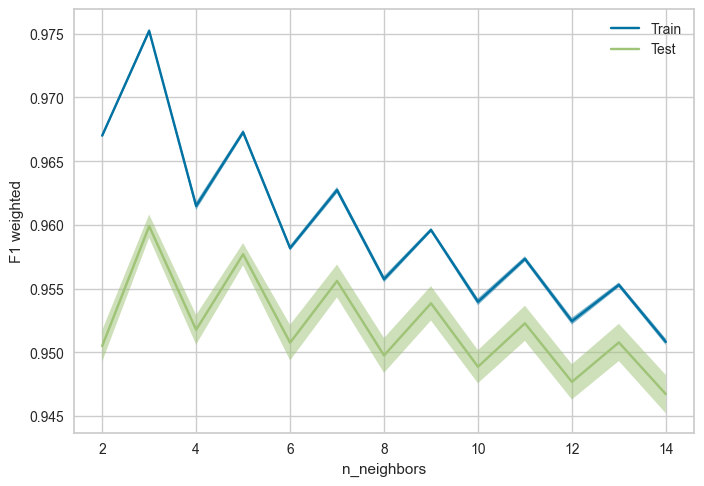

In [16]:

ValidationCurveDisplay.from_estimator(
model_knn, x_train2_, y_train2_, param_name="n_neighbors", param_range=neighbour_params, scoring='f1_weighted'
)

In [22]:
# defining parameter range 
param_grid = {'n_neighbors': neighbour_params,  
              'leaf_size': leaf_params
}
  
grid2 = GridSearchCV(model_knn, param_grid, refit = True, verbose = 1) 
  
# fitting the model for grid search 
grid2.fit(x_train2_, y_train2_) 

Fitting 5 folds for each of 54 candidates, totalling 270 fits


GridSearchCV(estimator=KNeighborsClassifier(),
             param_grid={'leaf_size': range(3, 30, 3),
                         'n_neighbors': range(2, 8)},
             verbose=1)

### Best Model

#### Data 1: Diabetes

In [149]:
best_knn = KNeighborsClassifier(
    n_neighbors=grid.best_params_['n_neighbors'], 
    leaf_size=grid.best_params_['leaf_size'])

best_knn.fit(x_train_, y_train_) 

# Evaluate on the test set
y_val_pred = best_knn.predict(x_val)
print("Val Set Evaluation:")
print("F1 Score: ", f1_score(y_val, y_val_pred, average='weighted'))
print("Accuracy: ", accuracy_score(y_val, y_val_pred))
print("Precision: ", precision_score(y_val, y_val_pred, average='weighted'))
print("Recall: ", recall_score(y_val, y_val_pred, average='weighted'))
print("ROC AUC: ", roc_auc_score(y_val, y_val_pred))

Val Set Evaluation:
F1 Score:  0.8353425450668346
Accuracy:  0.8357914029611386
Precision:  0.839650348173072
Recall:  0.8357914029611386
ROC AUC:  0.8358836525718442


In [150]:
# Evaluate on the test set
best_knn.fit(x_train, y_train) 
y_test_pred = best_knn.predict(x_test)
print("Test Set Evaluation:")
print("F1 Score: ", f1_score(y_test, y_test_pred, average='weighted'))
print("Accuracy: ", accuracy_score(y_test, y_test_pred))
print("Precision: ", precision_score(y_test, y_test_pred, average='weighted'))
print("Recall: ", recall_score(y_test, y_test_pred, average='weighted'))
print("ROC AUC: ", roc_auc_score(y_test, y_test_pred))

Test Set Evaluation:
F1 Score:  0.678647302618896
Accuracy:  0.6845772969007886
Precision:  0.6992872698400067
Recall:  0.6845772969007886
ROC AUC:  0.6845772969007885


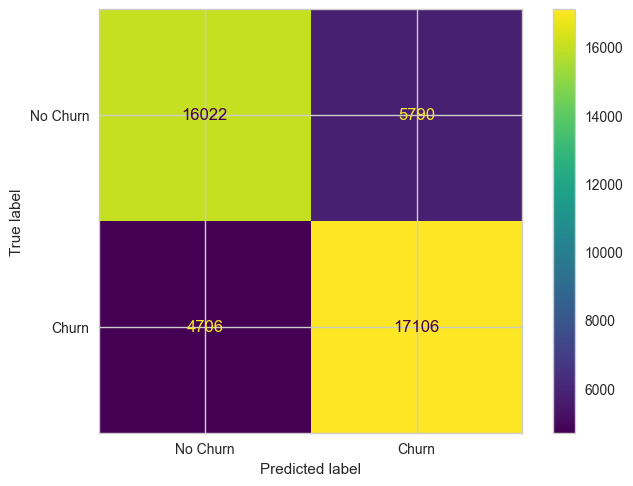

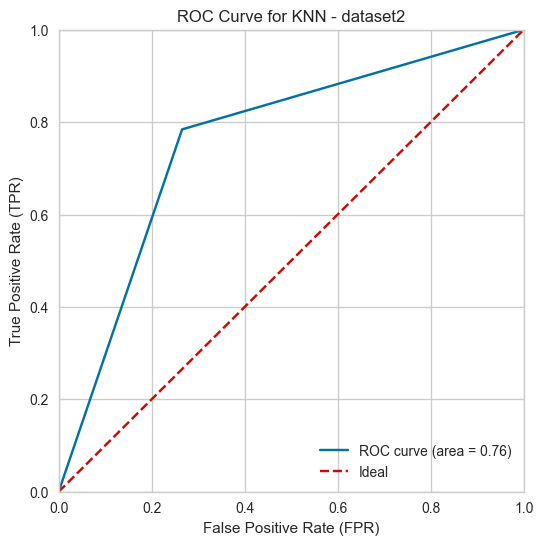

In [142]:
# Plot confusion matrix
best_knn.fit(x_train, y_train) 
cm = confusion_matrix(y_test, y_test_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Churn', 'Churn'])
disp.plot()
plt.show()

# Calculate ROC curve
fpr, tpr, _ = roc_curve(y_test, y_test_pred)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'r--', label='Ideal')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve for KNN - dataset2')
plt.legend(loc="lower right")
plt.show()

#### Data 2: Churn

In [26]:
best_knn = KNeighborsClassifier(
    n_neighbors=grid2.best_params_['n_neighbors'], 
    leaf_size=grid2.best_params_['leaf_size']
)

best_knn.fit(x_train2_, y_train2_) 

KNeighborsClassifier(leaf_size=3, n_neighbors=3)

In [27]:
# Evaluate on the test set
y_val_pred2 = best_knn.predict(x_val2)
print("Val Set Evaluation:")
print("F1 Score: ", f1_score(y_val2, y_val_pred2, average='weighted'))
print("Accuracy: ", accuracy_score(y_val2, y_val_pred2))
print("Precision: ", precision_score(y_val2, y_val_pred2, average='weighted'))
print("Recall: ", recall_score(y_val2, y_val_pred2, average='weighted'))
print("ROC AUC: ", roc_auc_score(y_val2, y_val_pred2))

Val Set Evaluation:
F1 Score:  0.9613964805116891
Accuracy:  0.9614519755862512
Precision:  0.9637749813455501
Recall:  0.9614519755862512
ROC AUC:  0.9612724437286836


In [28]:
# Evaluate on the test set
y_test_pred2 = best_knn.predict(x_test2)
print("Test Set Evaluation:")
print("F1 Score: ", f1_score(y_test2, y_test_pred2, average='weighted'))
print("Accuracy: ", accuracy_score(y_test2, y_test_pred2))
print("Precision: ", precision_score(y_test2, y_test_pred2, average='weighted'))
print("Recall: ", recall_score(y_test2, y_test_pred2, average='weighted'))
print("ROC AUC: ", roc_auc_score(y_test2, y_test_pred2))

Test Set Evaluation:
F1 Score:  0.9609093480200329
Accuracy:  0.9609583345281449
Precision:  0.9632805774806104
Recall:  0.9609583345281449
ROC AUC:  0.960958334528145


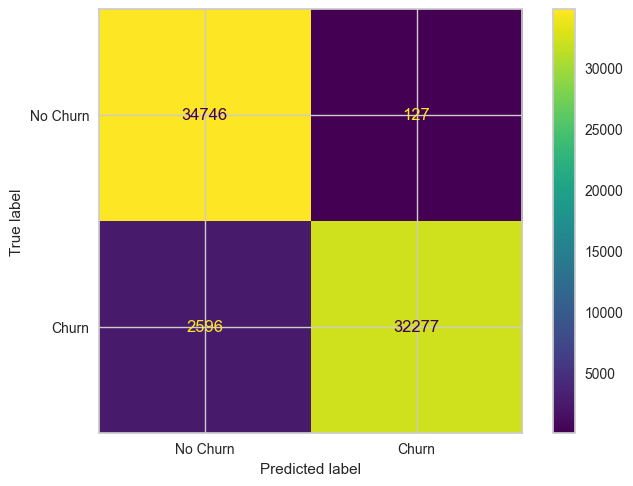

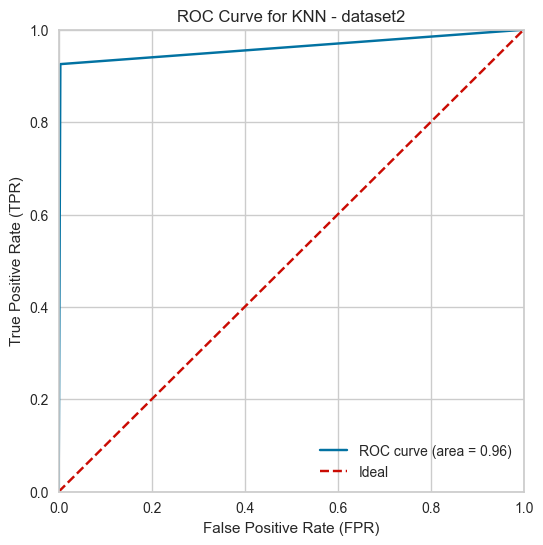

In [29]:
# Plot confusion matrix
cm = confusion_matrix(y_test2, y_test_pred2)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Churn', 'Churn'])
disp.plot()
plt.show()

# Calculate ROC curve
fpr, tpr, _ = roc_curve(y_test2, y_test_pred2)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'r--', label='Ideal')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve for KNN - dataset2')
plt.legend(loc="lower right")
plt.show()
